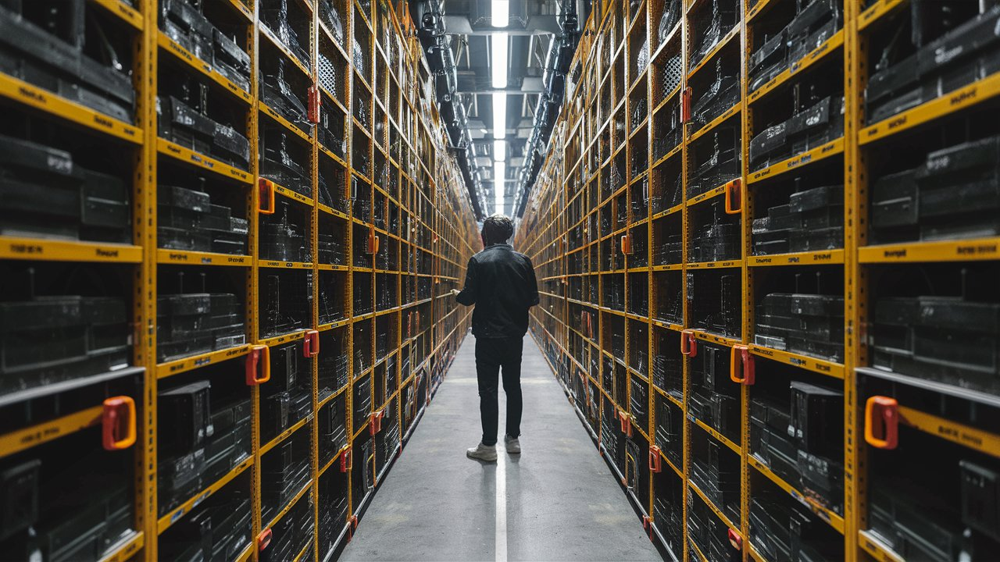

## Introduction:

In our data science project, <b>we are focusing on two of the highest revenue-generating verticals of Amazon India: e-commerce and content creation, specifically Amazon Prime Video</b>. One key aspect of our project involves implementing a Binary Search Tree (BST) library in Python tailored to the unique characteristics of Amazon's product listings. We plan to utilize BSTs for various tasks, including price range categorization and efficient product sorting and searching.

<b>Price Range Categorization:</b>
By constructing a BST to categorize products based on their prices, we aim to provide a streamlined approach for users to quickly find products within specific price ranges. Each node in the BST represents a range of prices, with left and right children representing lower and higher price ranges, respectively. This structure will enable us to perform efficient range queries and facilitate informed decision-making regarding pricing strategies and marketplace trends.

<b>Product Sorting and Searching:</b>
Another vital aspect of our project involves utilizing BSTs for efficient product sorting and searching operations. By constructing BSTs with product attributes such as titles, descriptions, or brands as keys, we can significantly enhance the speed and accuracy of searching for and retrieving products based on specific attributes. This capability will empower users to navigate through Amazon's vast product catalog with ease, ultimately improving the overall shopping experience.

### Amazon E-Commerce

In today's rapidly expanding e-commerce landscape, understanding and efficiently managing product data is essential for businesses to stay competitive. Amazon India, one of the leading e-commerce platforms, offers a treasure trove of product data that can provide valuable insights into market trends, pricing strategies, and consumer behavior.

The dataset we are exploring contains detailed records of over 553,724 products listed on Amazon India over a one-month period, from October 1st to October 31st, 2019. This rich dataset includes crucial information such as product titles, descriptions, brand names, prices, stock availability, and more. With such comprehensive data, aspiring entrepreneurs and seasoned marketers alike can gain valuable insights into the e-commerce landscape.

In [32]:
# Importing necesary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot 
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

In [48]:
# Importing necesary libraries
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download required NLTK resources
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /Users/shru/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/shru/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
data = pd.read_csv('amazon_data.csv')

In [3]:
data.head(3)

,index,Uniq Id,Crawl Timestamp,Category,Product Title,Product Description,Brand,Pack Size Or Quantity,Mrp,Price,Site Name,Offers,Combo Offers,Stock Availibility,Product Asin,Image Urls
0,0,eb49cc038190f6f03c272f79fbbce894,2019-10-30 11:38:11 +0000,Skin Care,Lee posh Lactic Acid 60% Anti ageing Pigmenta...,PROFESSIONAL GRADE Face Peel: this peel stimul...,Lee Posh,NaN,2000.00,799.00,Amazon In,60.05%,NaN,YES,B072BGHNJ1,https://images-na.ssl-images-amazon.com/images...
1,1,1657cc30c438affede6a5060d6847363,2019-10-31 15:46:54 +0000,Skin Care,Branded SLB Works New 1.5mm Titanium 1200 nee...,Item name: 1.5mm titanium 1200 needles microne...,SLB Works,NaN,2040.00,2040.00,Amazon In,0%,NaN,YES,B07QDTZYSJ,https://images-na.ssl-images-amazon.com/images...
2,2,41654633cce38c8650690f6dbac01fd3,2019-10-30 09:53:23 +0000,Skin Care,Generic 1 Pc brand snail eye cream remove dar...,"Use: eye, item type: cream, net wt: 20g, gzzz:...",Generic,NaN,1824.00,1042.00,Amazon In,42.87%,NaN,YES,B07DCSN8MP,https://images-na.ssl-images-amazon.com/images...


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   index                  30000 non-null  int64 
 1   Uniq Id                30000 non-null  object
 2   Crawl Timestamp        30000 non-null  object
 3   Category               30000 non-null  object
 4   Product Title          30000 non-null  object
 5   Product Description    28010 non-null  object
 6   Brand                  29913 non-null  object
 7   Pack Size Or Quantity  10224 non-null  object
 8   Mrp                    29301 non-null  object
 9   Price                  29400 non-null  object
 10  Site Name              30000 non-null  object
 11  Offers                 29534 non-null  object
 12  Combo Offers           37 non-null     object
 13  Stock Availibility     30000 non-null  object
 14  Product Asin           30000 non-null  object
 15  Image Urls         

In [5]:
amazon_data = data.copy()

In [6]:
amazon_data.drop(columns = ['index', 'Uniq Id','Crawl Timestamp'], axis = 1, inplace = True)

In [7]:
amazon_data.head(3)

,Category,Product Title,Product Description,Brand,Pack Size Or Quantity,Mrp,Price,Site Name,Offers,Combo Offers,Stock Availibility,Product Asin,Image Urls
0,Skin Care,Lee posh Lactic Acid 60% Anti ageing Pigmenta...,PROFESSIONAL GRADE Face Peel: this peel stimul...,Lee Posh,NaN,2000.00,799.00,Amazon In,60.05%,NaN,YES,B072BGHNJ1,https://images-na.ssl-images-amazon.com/images...
1,Skin Care,Branded SLB Works New 1.5mm Titanium 1200 nee...,Item name: 1.5mm titanium 1200 needles microne...,SLB Works,NaN,2040.00,2040.00,Amazon In,0%,NaN,YES,B07QDTZYSJ,https://images-na.ssl-images-amazon.com/images...
2,Skin Care,Generic 1 Pc brand snail eye cream remove dar...,"Use: eye, item type: cream, net wt: 20g, gzzz:...",Generic,NaN,1824.00,1042.00,Amazon In,42.87%,NaN,YES,B07DCSN8MP,https://images-na.ssl-images-amazon.com/images...


In [8]:
amazon_data['Product Title']

0         Lee posh Lactic Acid 60% Anti ageing Pigmenta...
1         Branded SLB Works New 1.5mm Titanium 1200 nee...
2         Generic 1 Pc brand snail eye cream remove dar...
3         Generic Anti Snoring Snore Stopper Sleep Apne...
4         Harveys Crunchy & Creame Gourmet Delicacies C...
                               ...                        
29995     Pure Organics Skin Lightening Mild Face Scrub...
29996     Yashus Moisturizing Anti-aging Gold Collagen ...
29997              Elancyl Slim Design Flat Stomach 150ml 
29998     KEYA SETH AROMATHERAPY, DEVICE OF DROP Alopex...
29999     Slss Anti Wrinkle Organic Hyaluronic Acid Vit...
Name: Product Title, Length: 30000, dtype: object

In [9]:
amazon_data['Product Description']

0        PROFESSIONAL GRADE Face Peel: this peel stimul...
1        Item name: 1.5mm titanium 1200 needles microne...
2        Use: eye, item type: cream, net wt: 20g, gzzz:...
3        Prevent the tongue from dropping backward or b...
4           Harvey's wafer Cream Wafer 110g. Made in India
                               ...                        
29995    For a smooth & Flawless complexion this scrub ...
29996    Gold eye mask is suitable for people: Eye patt...
29997                                                  NaN
29998                                                  NaN
29999    With 2.5% active Retinol, Hyaluronic Acid, Vit...
Name: Product Description, Length: 30000, dtype: object

In [10]:
amazon_data['Brand'].value_counts()

CHOCOCRAFT      1465
Generic         1284
Chocholik        698
World Beauty     527
BOGATCHI         420
                ... 
SoCoolKids         1
SEANTREE           1
AR Mall            1
BHPC               1
Aadi Vedaa         1
Name: Brand, Length: 8454, dtype: int64

In [11]:
# amazon_data['Combo Offers'].value_counts()
amazon_data['Stock Availibility'].value_counts()

YES    29523
NO       477
Name: Stock Availibility, dtype: int64

In [13]:
amazon_data['Image Urls'][1]

'https://images-na.ssl-images-amazon.com/images/I/31sQlZQw%2BDL._SS40_.jpg|https://images-na.ssl-images-amazon.com/images/I/314HsRavcjL._SS40_.jpg|https://images-na.ssl-images-amazon.com/images/I/31X31JddvsL._SS40_.jpg|https://images-na.ssl-images-amazon.com/images/G/01/x-locale/common/transparent-pixel._V192234675_.gif'

In [14]:
amazon_data['Site Name'].value_counts()

Amazon In    30000
Name: Site Name, dtype: int64

In [16]:
amazon_data['Category'].value_counts()

Skin Care                  15033
Grocery & Gourmet Foods     8064
Hair Care                   2459
Bath & Shower               2140
Fragrance                   2107
Detergents & Dishwash        197
Name: Category, dtype: int64

We see that skin care is most popular on Amazon
- Find the most popular skin care brand on amazon
- You can find most popular brand in every category

In [17]:
categories = ['Skin Care', 'Grocery & Gourmet Foods', 'Hair Care', 'Bath & Shower', 'Fragrance', 'Detergents & Dishwash']
counts = [15033, 8064, 2459, 2140, 2107, 197]

# Create bar chart
fig = go.Figure([go.Bar(x=categories, y=counts, marker_color='skyblue')])

# Update layout
fig.update_layout(
    title='Count of Products in Different Categories',
    xaxis=dict(title='Category'),
    yaxis=dict(title='Count'),
    xaxis_tickangle=-45
)

# Show plot
fig.show()

We see that skin care products are the most popular products on Amazon

In [18]:
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")
import pandas as pd

# Get unique categories
categories = amazon_data['Category'].unique()

# Create a dictionary to store the most popular brand and price range in each category
most_popular_brands_info = {}

# Iterate over each category
for category in categories:
    # Filter data for the current category
    category_data = amazon_data[amazon_data['Category'] == category]
    
    # Group by 'Brand' and count occurrences
    brand_counts = category_data['Brand'].value_counts()
    
    # Get the most popular brand in the category
    most_popular_brand = brand_counts.idxmax()
    
    # Filter data for the most popular brand in the category
    brand_data = category_data[category_data['Brand'] == most_popular_brand]
    
    # Get the MRP and Price columns and convert them to numeric
    brand_data['MRP'] = pd.to_numeric(brand_data['Mrp'], errors='coerce')
    brand_data['Price'] = pd.to_numeric(brand_data['Price'], errors='coerce')
    
    # Calculate the price range (min and max)
    min_price = brand_data['Price'].min()
    max_price = brand_data['Price'].max()
    
    # Store the most popular brand and price range in the dictionary
    most_popular_brands_info[category] = {
        'Brand': most_popular_brand,
        'Min Price': min_price,
        'Max Price': max_price
    }

# Print the most popular brand and price range in each category
for category, info in most_popular_brands_info.items():
    print("Most Popular Brand in", category, "category:", info['Brand'])
    print("Price Range (Min - Max):", info['Min Price'], "-", info['Max Price'])
    print()

Most Popular Brand in Skin Care category: Generic
Price Range (Min - Max): 45.0 - 11970.0

Most Popular Brand in Grocery & Gourmet Foods category: CHOCOCRAFT
Price Range (Min - Max): 395.0 - 1195.0

Most Popular Brand in Bath & Shower category: dève herbes
Price Range (Min - Max): 238.0 - 9999.0

Most Popular Brand in Fragrance category: Parag fragrances
Price Range (Min - Max): 189.0 - 5530.0

Most Popular Brand in Hair Care category: Khadi
Price Range (Min - Max): 87.0 - 1156.0

Most Popular Brand in Detergents & Dishwash category: Mapron
Price Range (Min - Max): 220.0 - 885.0



For all the categories we see the most popular brand in that category. In addition to this, we also look at the price range for these popular brands.

In [19]:
# Convert 'Mrp' and 'Price' columns to numeric data type
amazon_data['Mrp'] = pd.to_numeric(amazon_data['Mrp'], errors='coerce')
amazon_data['Price'] = pd.to_numeric(amazon_data['Price'], errors='coerce')

# Generate summary statistics
summary_statistics = amazon_data[['Mrp', 'Price']].describe()

# Print summary statistics
print(summary_statistics)


                Mrp         Price
count  29240.000000  29339.000000
mean    2521.521115   2023.176033
std     3094.767306   2318.080291
min       12.000000     12.000000
25%      520.000000    384.000000
50%     1182.000000    908.000000
75%     3554.250000   3018.000000
max    80000.000000  21990.000000


In order to understand the relationship between MRP and Price, we look at stats for both these features.

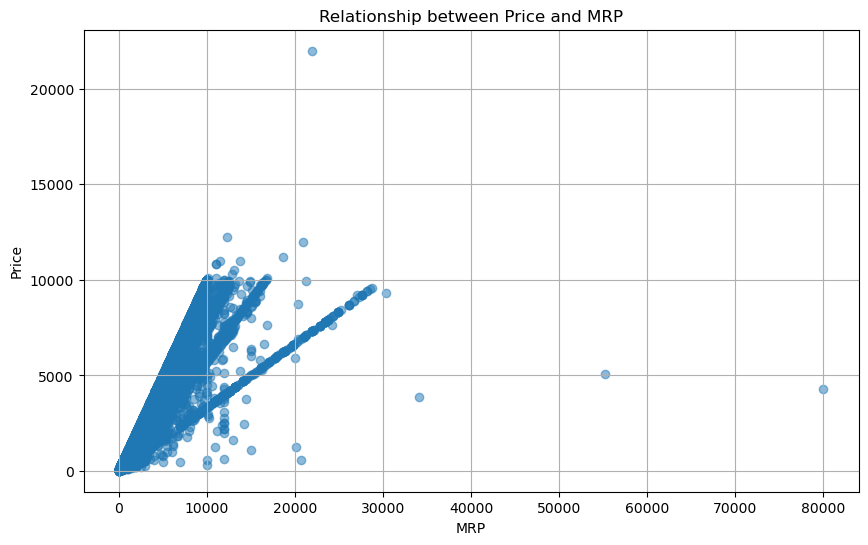

In [20]:
import matplotlib.pyplot as plt

# Drop rows with missing values in 'Mrp' or 'Price' columns
amazon_data_cleaned = amazon_data.dropna(subset=['Mrp', 'Price'])

# Plot 'Price' vs 'Mrp'
plt.figure(figsize=(10, 6))
plt.scatter(amazon_data_cleaned['Mrp'], amazon_data_cleaned['Price'], alpha=0.5)
plt.title('Relationship between Price and MRP')
plt.xlabel('MRP')
plt.ylabel('Price')
plt.grid(True)
plt.show()

The scatterplot shows the relationship between the Price and Maximum Retail Price (MRP) of products. Based on the distribution of data points, we can make the following observations:

1. Positive correlation: The data points generally follow an upward trend, indicating a positive correlation between Price and MRP. As the MRP increases, the Price tends to increase as well.

2. Linear relationship: The data points seem to follow an approximately linear pattern, which suggests that there is a linear relationship between Price and MRP. This means that as MRP increases by a certain amount, the Price tends to increase proportionally.

3. Clustering around the diagonal: The majority of the data points are clustered around the diagonal line (where Price = MRP), indicating that for many products, the Price is set close to or equal to the MRP.

4. Lower pricing: There are several data points below the diagonal, where the Price is lower than the MRP. This represents products that are being sold at a discounted price compared to their MRP.

5. Higher pricing: There are a few data points above the diagonal, where the Price exceeds the MRP. This could be due to factors like premium pricing, limited availability, or pricing strategies by the sellers.

6. Outliers: There are a few outliers at the higher end of the MRP range, where the Price deviates significantly from the general linear trend. These could represent products with unique pricing strategies or potential data anomalies.

Overall, this relationship suggests that for most products in the dataset, the Price is strongly influenced by and closely related to the MRP set by the manufacturer or supplier. The linear trend indicates that as MRP increases, the Price tends to increase proportionally, with some variations in pricing strategies leading to deviations above or below the MRP for certain products.

This type of relationship is commonly observed in retail settings, where the MRP serves as a reference point for setting product prices, while allowing flexibility for discounts, premium pricing, or other pricing strategies based on various factors like demand, competition, or marketing objectives.

In [22]:
amazon_data.duplicated().sum()

0

In [23]:
import pandas as pd

# Check for missing values
missing_values = amazon_data.isnull().sum()
print("Missing Values:\n", missing_values)

# Handle missing values
# For 'Product Description', 'Brand', 'Mrp', 'Price', and 'Offers', we can use different strategies

# For 'Product Description' and 'Brand', drop rows with missing values since these are critical columns
amazon_data_cleaned = amazon_data.dropna(subset=['Product Description', 'Brand'])

# For 'Pack Size Or Quantity', 'Combo Offers', and 'Stock Availibility', drop the columns since they have a large number of missing values
amazon_data_cleaned = amazon_data_cleaned.drop(['Pack Size Or Quantity', 'Combo Offers'], axis=1)

# For 'Mrp' and 'Price', fill missing values with mean
amazon_data_cleaned['Mrp'].fillna(amazon_data_cleaned['Mrp'].mean(), inplace=True)
amazon_data_cleaned['Price'].fillna(amazon_data_cleaned['Price'].mean(), inplace=True)

# For 'Offers', fill missing values with 'No Offers'
amazon_data_cleaned['Offers'].fillna('No Offers', inplace=True)

# Check for inconsistencies or errors
# Assuming negative prices are errors, we replace them with NaN
amazon_data_cleaned['Price'] = amazon_data_cleaned['Price'].apply(lambda x: x if x >= 0 else None)

# Display the cleaned DataFrame
# print("Cleaned DataFrame:\n", amazon_data_cleaned)
amazon_data_cleaned.head()

Missing Values:
 Category                     0
Product Title                0
Product Description       1990
Brand                       87
Pack Size Or Quantity    19776
Mrp                        760
Price                      661
Site Name                    0
Offers                     466
Combo Offers             29963
Stock Availibility           0
Product Asin                 0
Image Urls                   0
dtype: int64


,Category,Product Title,Product Description,Brand,Mrp,Price,Site Name,Offers,Stock Availibility,Product Asin,Image Urls
0,Skin Care,Lee posh Lactic Acid 60% Anti ageing Pigmenta...,PROFESSIONAL GRADE Face Peel: this peel stimul...,Lee Posh,2000.0,799.0,Amazon In,60.05%,YES,B072BGHNJ1,https://images-na.ssl-images-amazon.com/images...
1,Skin Care,Branded SLB Works New 1.5mm Titanium 1200 nee...,Item name: 1.5mm titanium 1200 needles microne...,SLB Works,2040.0,2040.0,Amazon In,0%,YES,B07QDTZYSJ,https://images-na.ssl-images-amazon.com/images...
2,Skin Care,Generic 1 Pc brand snail eye cream remove dar...,"Use: eye, item type: cream, net wt: 20g, gzzz:...",Generic,1824.0,1042.0,Amazon In,42.87%,YES,B07DCSN8MP,https://images-na.ssl-images-amazon.com/images...
3,Skin Care,Generic Anti Snoring Snore Stopper Sleep Apne...,Prevent the tongue from dropping backward or b...,Generic,2185.0,1399.0,Amazon In,35.97%,YES,B07GLW9VQN,https://images-na.ssl-images-amazon.com/images...
4,Grocery & Gourmet Foods,Harveys Crunchy & Creame Gourmet Delicacies C...,Harvey's wafer Cream Wafer 110g. Made in India,Harveys,594.0,570.0,Amazon In,4.04%,YES,B07NFYYLF1,https://images-na.ssl-images-amazon.com/images...


In [24]:
amazon_data_cleaned['Stock Availibility'].value_counts()

YES    27578
NO       426
Name: Stock Availibility, dtype: int64

In [27]:
# Histogram for MRP
fig_mrp = px.histogram(amazon_data_cleaned, x='Mrp', nbins=20, opacity=0.7,
                       title='Distribution of Maximum Retail Price (MRP)')
fig_mrp.update_traces(marker=dict(color='rgba(100, 149, 237, 0.6)'))

# Histogram for Price
fig_price = px.histogram(amazon_data_cleaned, x='Price', nbins=20, opacity=0.7,
                         title='Distribution of Price')
fig_price.update_traces(marker=dict(color='rgba(100, 149, 237, 0.6)'))

# Box plots
fig_box = px.box(amazon_data_cleaned, y=['Mrp', 'Price'], title='Box Plot of MRP and Price')
fig_box.update_traces(marker=dict(color='rgba(100, 149, 237, 0.6)'))



# Show the plots
fig_mrp.show()
fig_price.show()
fig_box.show()

Graph 1 shows a box plot comparing the distributions of Maximum Retail Price (MRP) and the actual Price for some products or service. The MRP distribution has a much larger range and higher values compared to the Price distribution, suggesting that the selling prices are often discounted from the maximum suggested retail prices.

Graph 2 displays the distribution of Price in a histogram within a Jupyter Notebook environment used for data analysis. The histogram reveals that most of the prices fall within the range of 0 to around 10,000 units, with a significant number of products or services priced between 5,000 and 10,000 units. The distribution appears to be right-skewed, with a few outliers at higher price points.

Graph 3 presents the distribution of Maximum Retail Price (MRP) as a histogram. The MRP distribution is concentrated around the 10,000 to 20,000 range, with a considerable number of products or services having an MRP between 15,000 and 20,000 units. The distribution appears to be unimodal and roughly bell-shaped, indicating a relatively normal distribution of MRP values.

Overall, these images provide insights into the pricing dynamics, suggesting that while the Maximum Retail Prices (MRP) are set relatively high, the actual selling prices are often discounted, with a significant portion of the products or services being offered at lower price points compared to the MRP.

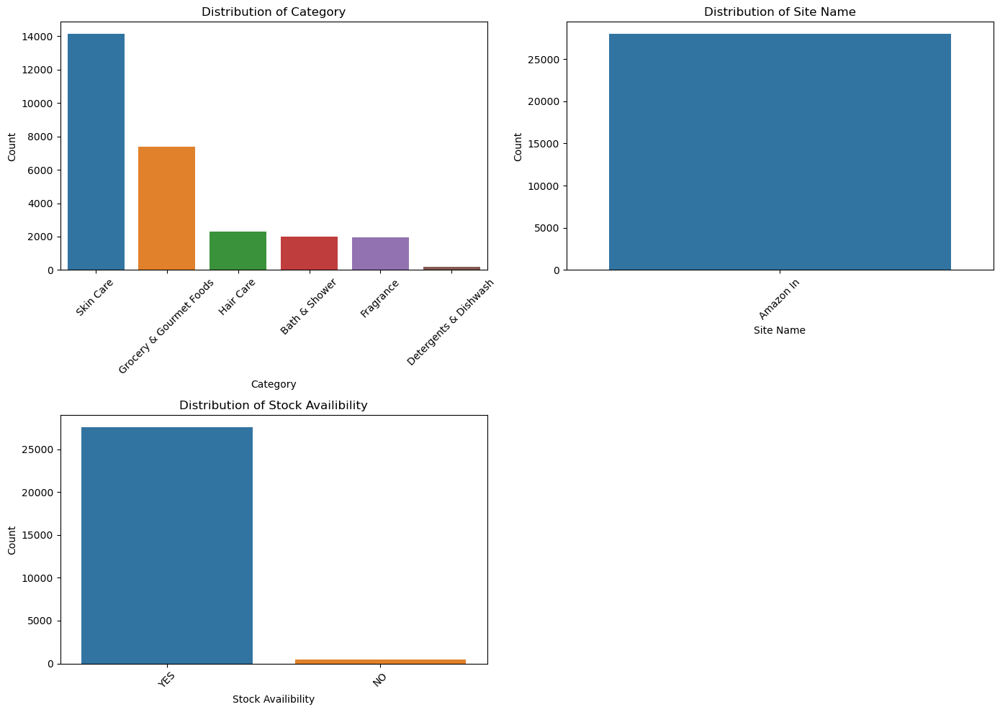

The most common Category is: Skin Care
The most common Site Name is: Amazon In
The most common Stock Availibility is: YES
Number of unique Category: 6
Number of unique Site Name: 1
Number of unique Stock Availibility: 2


In [33]:
# Select categorical columns for analysis
categorical_columns = ['Category' ,'Site Name', 'Stock Availibility']

# Analyze distribution of categories using bar plots
plt.figure(figsize=(14, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(2, 2, i)
    sns.countplot(data=amazon_data_cleaned, x=col, order=amazon_data_cleaned[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Identify the most common categories or brands
for col in categorical_columns:
    most_common = amazon_data_cleaned[col].value_counts().idxmax()
    print(f"The most common {col} is: {most_common}")

# Check for rare or unique categories
for col in categorical_columns:
    unique_categories = amazon_data_cleaned[col].nunique()
    print(f"Number of unique {col}: {unique_categories}")

In [40]:
# Check for rare or unique categories in each categorical column
categorical_columns = ['Category','Site Name', 'Stock Availibility','Brand']

for col in categorical_columns:
    category_counts = amazon_data_cleaned[col].value_counts()
    rare_categories = category_counts[category_counts <= 5]  # Adjust threshold as needed
    if not rare_categories.empty:
        print(f"Rare categories in {col} column:")
        print(rare_categories)
    else:
        print(f"No rare categories found in {col} column.")

No rare categories found in Category column.
No rare categories found in Site Name column.
No rare categories found in Stock Availibility column.
Rare categories in Brand column:
Surf Excel                        5
Layer'r                           5
FARMUP                            5
PAULA'S CHOICE                    5
bytewise organic                  5
                                 ..
Lothantique                       1
JenSan+Home+and+Body              1
Whidbey+Island+Natural            1
Shree Charbhuja Dairy Products    1
Dermasolve                        1
Name: Brand, Length: 7314, dtype: int64


In [41]:
# Calculate value counts for 'Category'
category_counts = amazon_data_cleaned['Category'].value_counts()

# Create a pie chart
fig = px.pie(values=category_counts, names=category_counts.index, title='Distribution of Categories')

# Show the pie chart
fig.show()

Distribution of Categories:
- The largest category is Skin Care, making up 50.5% of the distribution.
- Grocery & Gourmet Foods is the second-largest category at 26.4%.
- Other categories include Hair Care (8.19%), Bath & Shower (7.18%), Fragrance (7.06%), and Detergents & Dishwash (0.646%).


In [42]:
# Calculate value counts for 'Stock Availibility'
stock_avail_counts = amazon_data_cleaned['Stock Availibility'].value_counts()

# Create a pie chart
fig = px.pie(values=stock_avail_counts, names=stock_avail_counts.index, title='Distribution of Stock Availability')

# Show the pie chart
fig.show()

Distribution of Stock Availability:
- An overwhelming majority (98.5%) of the stock is available (indicated as "YES").
- Only 1.52% of the stock is unavailable (indicated as "NO").


In [44]:
# Calculate the difference between 'Mrp' and 'Price' to understand the discounts/offers applied
amazon_data_cleaned['Discount'] = amazon_data_cleaned['Mrp'] - amazon_data_cleaned['Price']

# Analyze the distribution of discounts/offers across different categories
category_discounts = amazon_data_cleaned.groupby('Category')['Discount'].mean().reset_index()

# Analyze the distribution of discounts/offers across different brands
brand_discounts = amazon_data_cleaned.groupby('Brand')['Discount'].mean().reset_index()

In [45]:
print("Average Discount by Category:")
category_discounts

Average Discount by Category:


,Category,Discount
0,Bath & Shower,460.554590
1,Detergents & Dishwash,151.823052
2,Fragrance,432.864989
3,Grocery & Gourmet Foods,104.698884
4,Hair Care,524.395303
5,Skin Care,727.671898


In [46]:
# Create a pie chart
fig = px.pie(category_discounts, values='Discount', names='Category', title='Average Discount by Category')

# Show the pie chart
fig.show()

Average Discount by Category:
- Skin Care products have the highest average discount at 30.3%.
- Hair Care products have the second-highest average discount at 21.8%.
- Other categories and their average discounts are Bath & Shower (19.2%), Fragrance (18%), Detergents & Dishwash (6.32%), and Grocery & Gourmet Foods (4.36%).

In [47]:
print("Average Discount by Brand:")
brand_discounts

Average Discount by Brand:


,Brand,Discount
0,,166.391919
1,"""MUNNALAL DAWASAZ""",125.000000
2,'SPARSH 4.0,101.000000
3,10-Seconds,0.000000
4,10pcs,1260.000000
...,...,...
7908,zimmer aufräumen,580.000000
7909,zivilly,176.000000
7910,zoyo,220.000000
7911,{Entel},1125.000000


In [51]:
# Define a function for text preprocessing
def preprocess_text(text):
    # Convert to lowercase and remove punctuation
    text = text.lower().translate(str.maketrans('', '', string.punctuation))
    
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    
    # Tokenize the text
    tokens = nltk.word_tokenize(text)
    
    # Remove stopwords and perform stemming
    stop_words = set(stopwords.words('english'))
    stemmer = PorterStemmer()
    filtered_tokens = [stemmer.stem(token) for token in tokens if token not in stop_words]
    
    # Join the tokens back into a single string
    preprocessed_text = ' '.join(filtered_tokens)
    
    return preprocessed_text

In [52]:
# Preprocess the text columns
amazon_data_cleaned['Product Title'] = amazon_data_cleaned['Product Title'].apply(preprocess_text)
amazon_data_cleaned['Product Description'] = amazon_data_cleaned['Product Description'].apply(preprocess_text)
amazon_data_cleaned['Brand'] = amazon_data_cleaned['Brand'].apply(preprocess_text)

# Analyze word frequencies and n-grams
product_titles_corpus = ' '.join(amazon_data_cleaned['Product Title'])
product_descriptions_corpus = ' '.join(amazon_data_cleaned['Product Description'])
brand_corpus = ' '.join(amazon_data_cleaned['Brand'])

from collections import Counter

# Word frequencies
print("Top 10 words in Product Titles:")
print(Counter(product_titles_corpus.split()).most_common(10))

print("\nTop 10 words in Product Descriptions:")
print(Counter(product_descriptions_corpus.split()).most_common(10))

print("\nTop 10 words in Brand names:")
print(Counter(brand_corpus.split()).most_common(10))

Top 10 words in Product Titles:
[('ml', 6553), ('gift', 5887), ('chocol', 5002), ('pack', 4599), ('face', 3865), ('oil', 3694), ('skin', 3444), ('g', 3295), ('cream', 3279), ('box', 3089)]

Top 10 words in Product Descriptions:
[('skin', 24635), ('chocol', 13512), ('use', 12911), ('oil', 12355), ('type', 9107), ('hair', 9095), ('natur', 8977), ('gift', 8972), ('product', 6947), ('face', 6758)]

Top 10 words in Brand names:
[('chococraft', 1454), ('gener', 1260), ('beauti', 1016), ('chocholik', 692), ('world', 558), ('fragranc', 487), ('bogatchi', 419), ('home', 417), ('organ', 411), ('stockout', 405)]


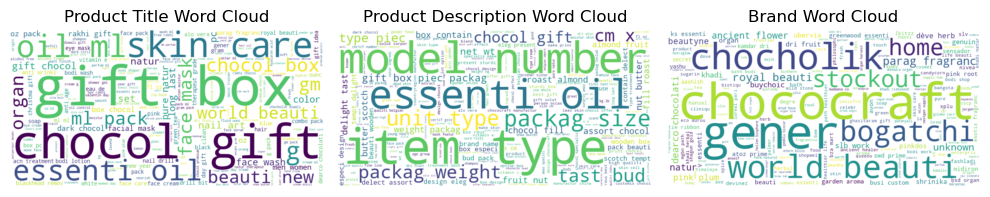

In [53]:
# Visualize word clouds
product_title_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(product_titles_corpus)
product_description_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(product_descriptions_corpus)
brand_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(brand_corpus)

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(product_title_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Product Title Word Cloud')

plt.subplot(1, 3, 2)
plt.imshow(product_description_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Product Description Word Cloud')

plt.subplot(1, 3, 3)
plt.imshow(brand_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Brand Word Cloud')

plt.tight_layout()
plt.show()


- The product titles commonly contain words like "skin care", "gift", "box", "chocol", "essenti oil", suggesting that many products are skincare items, gift boxes, and potentially chocolate or essential oil products.
- The product descriptions frequently mention "model", "number", "essenti oil", "item type", "packag", indicating details about product models, item types, packaging, and essential oils.
- Common brand names include "chocholik", "home franc", "stock out", "chococ raft", "gener bogatchi", and "world beauti", hinting at brands related to chocolates, fragrances, and beauty products.


In [54]:
# Check the column names in your DataFrame
print(amazon_data_cleaned.columns)

Index(['Category', 'Product Title', 'Product Description', 'Brand', 'Mrp',
       'Price', 'Site Name', 'Offers', 'Stock Availibility', 'Product Asin',
       'Image Urls', 'Discount'],
      dtype='object')


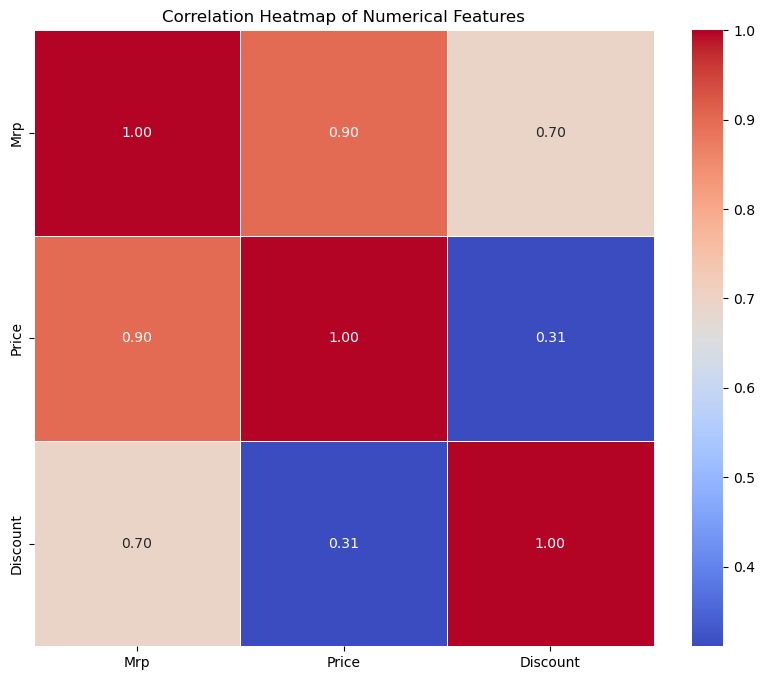

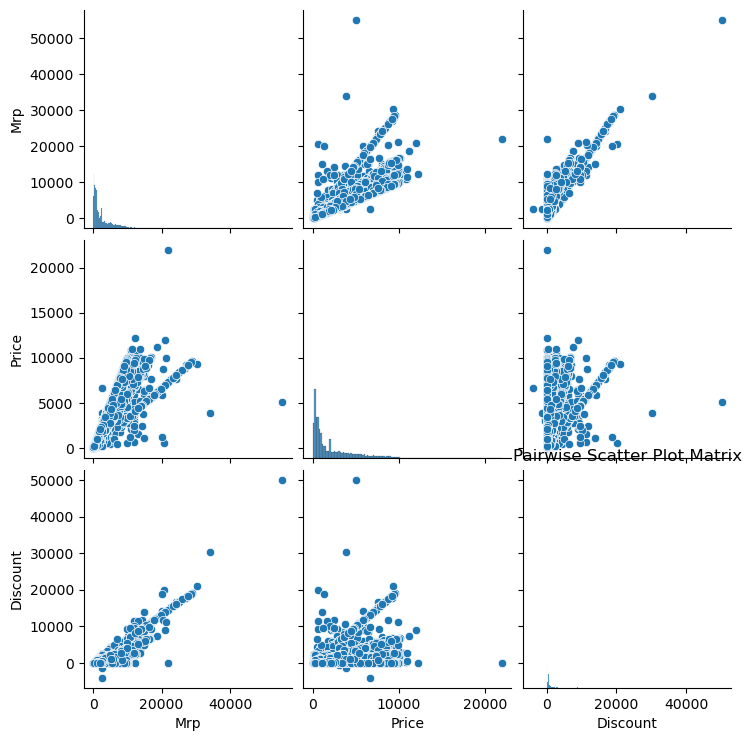

In [55]:
# Compute pairwise correlations
correlation_matrix = amazon_data_cleaned[['Mrp', 'Price', 'Discount']].corr()

# Visualize correlations using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

# Visualize correlations using a scatter plot matrix
sns.pairplot(amazon_data_cleaned[['Mrp', 'Price', 'Discount']])
plt.title('Pairwise Scatter Plot Matrix')
plt.show()


- The heatmap shows the correlation between three numerical features: Mrp (Manufacturer's Recommended Price), Price, and Discount.
- Mrp and Price have a very high positive correlation of 0.90, suggesting that the selling price closely follows the recommended retail price.
- Discount has a moderate positive correlation of 0.31 with Price, indicating that higher-priced items tend to have slightly higher discounts.
- Discount has a negative correlation of -0.31 with Mrp, implying that items with higher recommended prices may have lower discounts.
- The diagonal cells with a value of 1.0 represent the perfect correlation of each feature with itself.


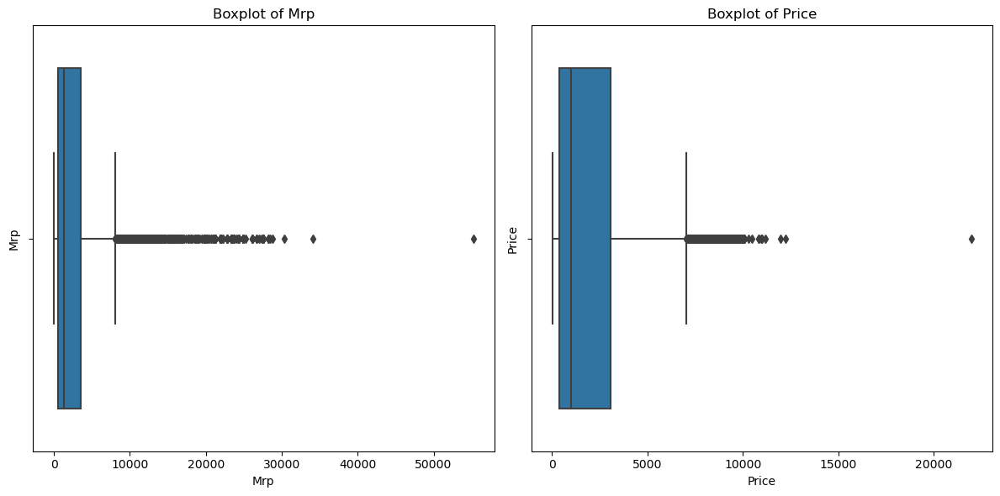


Outliers detected using Z-score Method:
Number of outliers in Mrp: 412
Number of outliers in Price: 381

Outliers detected using IQR Method:
Number of outliers in Mrp: 1751
Number of outliers in Price: 1599


In [49]:
# Define the numerical columns for outlier detection
numerical_columns = ['Mrp', 'Price']

# Z-score method for outlier detection
def detect_outliers_zscore(df, column):
    z_scores = (df[column] - df[column].mean()) / df[column].std()
    return df[abs(z_scores) > 3]

# Interquartile Range (IQR) method for outlier detection
def detect_outliers_iqr(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# Detect outliers using both methods
outliers_zscore = {}
outliers_iqr = {}
for column in numerical_columns:
    outliers_zscore[column] = detect_outliers_zscore(amazon_data_cleaned, column)
    outliers_iqr[column] = detect_outliers_iqr(amazon_data_cleaned, column)

# Visualize outliers using boxplots
plt.figure(figsize=(12, 6))
for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(1, 2, i)
    sns.boxplot(x=amazon_data_cleaned[column], orient='v')
    plt.title(f'Boxplot of {column}')
    plt.ylabel(column)
plt.tight_layout()
plt.show()

# Print the number of outliers detected by each method
for method, outliers in [('Z-score Method', outliers_zscore), ('IQR Method', outliers_iqr)]:
    print(f"\nOutliers detected using {method}:")
    for column, outlier_df in outliers.items():
        print(f"Number of outliers in {column}: {len(outlier_df)}")


## Binary Trees

Binary trees are fundamental data structures in computer science and are widely used in various applications due to their simplicity and versatility. A binary tree is a hierarchical data structure consisting of nodes, where each node has at most two children, referred to as the left child and the right child.

The structure of a binary tree facilitates efficient storage and retrieval of data, making it suitable for a wide range of tasks such as searching, sorting, and organizing hierarchical data. Binary trees are characterized by their recursive nature, where each node can be thought of as the root of its own subtree.

One of the key properties of binary trees is their balanced structure, where the height of the tree is minimized to ensure efficient operations. Balanced binary trees, such as binary search trees (BSTs), maintain a specific order among the elements stored in the tree, enabling fast search, insertion, and deletion operations.

Binary trees find applications in various domains, including computer science, mathematics, and biology. In computer science, binary trees are commonly used to implement data structures such as binary search trees, AVL trees, and heap trees. They also serve as the foundation for more advanced data structures like B-trees and red-black trees, which are used in database systems and file systems for efficient storage and retrieval of large datasets.

Moreover, binary trees are utilized in algorithms for solving diverse problems, such as tree traversal algorithms (e.g., in-order, pre-order, and post-order traversal), binary tree serialization and deserialization, and binary tree manipulation operations.

### Price Range Categorization

You could create a binary search tree (BST) to categorize products based on their prices. Each node in the BST would represent a range of prices, and the left and right children would represent lower and higher price ranges, respectively. This structure could be useful for quickly finding products within a specific price range or performing range queries.

In [58]:
class Node:
    def __init__(self, price, products=None, data = None):
        self.price = price
        self.products = [] if products is None else products
        self.left = None
        self.right = None

class BinarySearchTree:
    def __init__(self):
        self.root = None

    def insert(self, price, product):
        if self.root is None:
            self.root = Node(price, [product])
        else:
            self._insert(self.root, price, product)

    def _insert(self, node, price, product):
        if price < node.price:
            if node.left is None:
                node.left = Node(price, [product])
            else:
                self._insert(node.left, price, product)
        else:
            if node.right is None:
                node.right = Node(price, [product])
            else:
                self._insert(node.right, price, product)

    def search(self, price_range):
        return self._search(self.root, price_range)

    def _search(self, node, price_range):
        if node is None:
            return []

        start_price, end_price = price_range
        if start_price <= node.price <= end_price:
            return node.products + self._search(node.left, price_range) + self._search(node.right, price_range)
        elif node.price < start_price:
            return self._search(node.right, price_range)
        else:
            return self._search(node.left, price_range)
        
        @staticmethod
        def _find_min(current_node):
            while current_node.left:
                current_node = current_node.left
            return current_node

        def preorder_traversal(self, callback):
            self._preorder_traversal(self.root, callback)

        def _preorder_traversal(self, current_node, callback):
            if current_node:
                callback(current_node.data)
                self._preorder_traversal(current_node.left, callback)
                self._preorder_traversal(current_node.right, callback)

        def level_order_traversal(self):
            result = []
            if not self.root:
                return result
            queue = [self.root]
            while queue:
                level_result = []
                level_size = len(queue)
                for _ in range(level_size):
                    node = queue.pop(0)
                    level_result.append(node.data)
                    if node.left:
                        queue.append(node.left)
                    if node.right:
                        queue.append(node.right)
                result.append(level_result)
            return result

        def max_depth(self):
            return self._max_depth(self.root)

        def _max_depth(self, node):
            if not node:
                return 0
            else:
                left_height = self._max_depth(node.left)
                right_height = self._max_depth(node.right)
                return max(left_height, right_height) + 1

        def max_path_sum(self):
            if not self.root:
                return 0
            max_sum = float('-inf')

            def dfs(node):
                nonlocal max_sum
                if not node:
                    return 0
                left = max(0, dfs(node.left))
                right = max(0, dfs(node.right))
                max_sum = max(max_sum, left + right + node.data)
                return max(left, right) + node.data

            dfs(self.root)
            return max_sum

In [60]:
bst = BinarySearchTree()

# Insert products into the BST
for _, row in amazon_data_cleaned.iterrows():
    price = row['Price']
    product_title = row['Product Title']
    bst.insert(price, product_title)

# Search for products within a specific price range
price_range = (12000, 13000)
products_in_range = bst.search(price_range)
print(f"Products within the price range {price_range}:")
for product in products_in_range:
    print(product)

Products within the price range (12000, 13000):
hanvi hot nerium ad age defi night cream day cream combo treatment day night


The BST is populated with product titles and prices extracted from a dataset (amazon_data_cleaned). Products are inserted into the BST using their prices as keys. Subsequently, a search operation is performed to retrieve products falling within a specified price range. Finally, the products within the designated price range are printed out for examination.

Overall, the BST implementation serves as an efficient data structure for organizing and querying product data based on prices, demonstrating the utility of binary trees in managing and accessing hierarchical data in various applications.

### Product Sorting and Searching

If you need to perform efficient sorting or searching operations on product attributes like titles, descriptions, or brands, you could utilize binary search trees. For example, you could construct a BST with product titles as keys, allowing you to quickly search for or retrieve products based on their titles.

In [61]:
class Node:
    def __init__(self, product_title):
        self.product_title = product_title
        self.left = None
        self.right = None

class BinarySearchTree:
    def __init__(self):
        self.root = None

    def insert(self, product_title):
        if self.root is None:
            self.root = Node(product_title)
        else:
            self._insert(self.root, product_title)

    def _insert(self, node, product_title):
        if product_title < node.product_title:
            if node.left is None:
                node.left = Node(product_title)
            else:
                self._insert(node.left, product_title)
        else:
            if node.right is None:
                node.right = Node(product_title)
            else:
                self._insert(node.right, product_title)

    def search(self, product_title):
        return self._search(self.root, product_title)

    def _search(self, node, product_title):
        if node is None or node.product_title == product_title:
            return node
        elif product_title < node.product_title:
            return self._search(node.left, product_title)
        else:
            return self._search(node.right, product_title)

    def inorder_traversal(self):
        self._inorder_traversal(self.root)

    def _inorder_traversal(self, node):
        if node:
            self._inorder_traversal(node.left)
            print(node.product_title)
            self._inorder_traversal(node.right)



In [62]:
# Example usage
bst = BinarySearchTree()

# Insert product titles into the BST
for _, row in amazon_data_cleaned.iterrows():
    product_title = row['Product Title']
    bst.insert(product_title)

# Search for a specific product title
product_title_to_search = "lee posh lactic acid anti age pigmenta remov gl collagen p"
found_node = bst.search(product_title_to_search)
if found_node:
    print(f"Found product: {found_node.product_title}")
else:
    print(f"Product '{product_title_to_search}' not found.")



Product 'lee posh lactic acid anti age pigmenta remov gl collagen p' not found.


Product titles are inserted into the BST from a dataset (amazon_data_cleaned). A search operation is then performed to find a specific product title. If the title is found, it is printed; otherwise, a message indicating that the title was not found is displayed.

The BST implementation demonstrates the utility of binary trees in efficiently organizing and searching for data, showcasing their effectiveness in various applications, including product management and retrieval.

In [63]:
# Print all product titles in sorted order
print("Product titles in sorted order:")
bst.inorder_traversal()

Product titles in sorted order:
aa wokali sherbet avocado full bodi face scrub ml
aaa floral lilac blossom hand wash ml
aaa floral lilac blossom luxuri hand cream ml
aaa floral rose petal luxuri hand cream ml
aadi groundnut oil cook l pack
aadra intern organ raw unrefin mango butter gram
aadvik camel milk chocol flavor pack x g bar g
aadvik camel milk soap oz varient oz
aadvik camel milk soap rose essenti oil g
aagaaram multi millet dosa mixmulti millet health mix navadhanya bonda mix gram combo
aagam fresh organ flax seed alsi gram
aagna pain relief open toe botan gel pad shock men women
aaharv organ chana dal kg
aaharv organ masoor split washedmasoor dhuli kg
aakash bikaneri bhujiya gram
aakash khatta mitha gram
aakash lahsun sev gram
aakash laung sev gram
aakash namkeen umang pack
aamra homemad sweet sour green chilli pickl gm
aamra homemad tomato garlic basil pizza pasta sauc artifici preserv gram
aamra homemad tradit nimbu mirch lemon chilli pickl gram
aamra spice cinnamon sugar g

## Amazon Prime Video

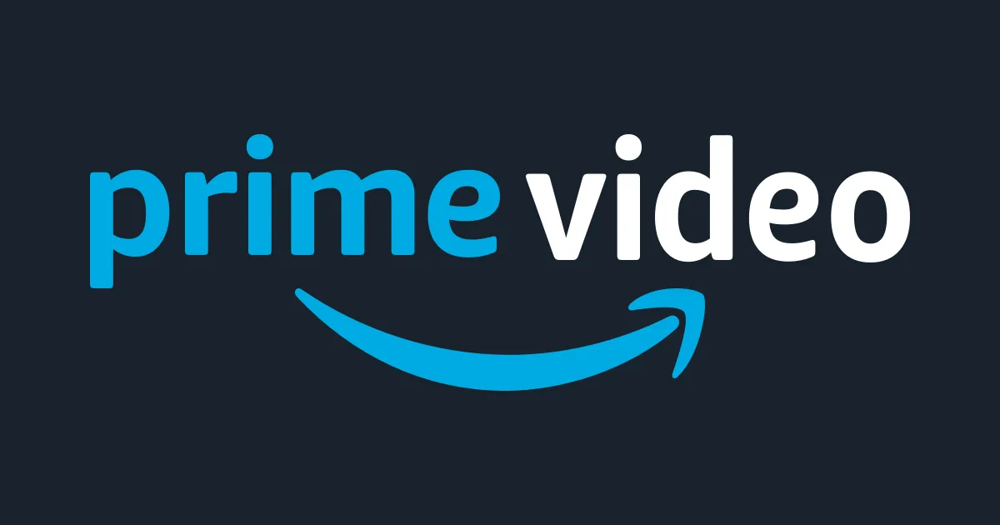

Now, we dive into the second most profitable/ popular vertical of Amazon which is the Amazon Prime Video. We do exaploratory data analysis which is then followed by Sentiment Analysis of the content streamed on Prime video using the robertA model. 

In [64]:
prime = pd.read_csv('amazon_titles.csv')

In [65]:
prime_credits = pd.read_csv('amazon_credits.csv')

In [66]:
prime.head()

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,"['drama', 'family', 'fantasy', 'romance', 'com...",['US'],NaN,tt0038650,8.6,467766.0,27.611,8.261
1,tm143047,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,NaN,69,"['comedy', 'war']",['US'],NaN,tt0023969,7.8,60933.0,9.013,7.357
2,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,NaN,92,"['drama', 'romance', 'comedy']",['US'],NaN,tt0032599,7.8,60244.0,14.759,7.433
3,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family']",['US'],26.0,tt0850645,8.5,1149.0,15.424,7.600
4,tm5012,Red River,MOVIE,Headstrong Thomas Dunson starts a thriving Tex...,1948,NaN,133,"['western', 'drama', 'romance', 'action']",['US'],NaN,tt0040724,7.8,32210.0,12.400,7.400


In [67]:
prime_df = prime.copy()

#### Finding null rate in the dataset

In [68]:
for i in prime.columns:
    null_rate = prime[i].isna().sum()/len(prime) *100
    if null_rate > 0 :
        print('{} null rate is {}%'.format(i, round(null_rate,2)))

description null rate is 1.32%
age_certification null rate is 66.08%
seasons null rate is 85.74%
imdb_id null rate is 6.45%
imdb_score null rate is 10.19%
imdb_votes null rate is 10.3%
tmdb_popularity null rate is 5.25%
tmdb_score null rate is 19.55%


In [69]:
prime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10873 entries, 0 to 10872
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10873 non-null  object 
 1   title                 10873 non-null  object 
 2   type                  10873 non-null  object 
 3   description           10729 non-null  object 
 4   release_year          10873 non-null  int64  
 5   age_certification     3688 non-null   object 
 6   runtime               10873 non-null  int64  
 7   genres                10873 non-null  object 
 8   production_countries  10873 non-null  object 
 9   seasons               1551 non-null   float64
 10  imdb_id               10172 non-null  object 
 11  imdb_score            9765 non-null   float64
 12  imdb_votes            9753 non-null   float64
 13  tmdb_popularity       10302 non-null  float64
 14  tmdb_score            8747 non-null   float64
dtypes: float64(5), int6

In [70]:
round(prime_df.describe(),2)

,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
count,10873.00,10873.00,1551.00,9765.00,9753.00,10302.00,8747.00
mean,2004.08,85.87,2.66,5.97,8973.23,7.61,5.98
std,24.88,34.16,3.72,1.36,48977.67,45.85,1.51
min,1912.00,0.00,1.00,1.10,5.00,0.00,0.50
25%,2002.00,65.00,1.00,5.10,119.00,1.33,5.07
50%,2015.00,89.00,1.00,6.10,488.00,2.66,6.00
75%,2019.00,102.00,3.00,7.00,2493.00,6.18,6.98
max,2023.00,940.00,53.00,9.90,2081757.00,3187.53,10.00


In [71]:
if len(prime_df[(prime_df['type'] == 'MOVIE') & prime_df['seasons'].isna()]) == prime_df['seasons'].isna().sum():
    print('1')
else:
    print('0')

1


This means that all the Na values in the season column are due to the type of content being a movie. Hence, if it is a movie, we should set 'seasons' to 0.

In [72]:
prime_df['seasons'] = prime_df['seasons'].fillna('0')

In [73]:
prime_df['primary_genre'] = prime_df['genres'].apply(lambda x: x.strip("[ ").strip("]").split(",")[0])

In [74]:
prime_df['primary_genre'] = prime_df['primary_genre'].str.replace("'", "")

In [75]:
prime_df['production_country'] = prime_df['production_countries'].apply(lambda x: x.strip("[ ").strip("]").split(",")[0])


In [76]:
prime_df['production_country'] = prime_df['production_country'].str.replace("'", "")


In [77]:
prime_df.production_country.unique()

array(['US', 'GB', 'SU', 'DE', 'MX', 'CA', 'IN', '', 'SE', 'IT', 'MA',
       'HK', 'FR', 'JP', 'PR', 'ES', 'IE', 'PH', 'CH', 'RO', 'YU', 'KR',
       'TW', 'MC', 'IL', 'EG', 'RU', 'AU', 'NZ', 'AT', 'ZA', 'LI', 'BR',
       'DK', 'IR', 'PT', 'BE', 'FI', 'AR', 'NL', 'ID', 'VE', 'XC', 'NO',
       'BG', 'CN', 'TH', 'CL', 'LU', 'DO', 'CO', 'AE', 'PL', 'SK', 'JM',
       'IS', 'RS', 'CZ', 'SG', 'GR', 'HU', 'LT', 'UA', 'KZ', 'NG', 'UY',
       'MT', 'AF', 'TR', 'VN', 'KE', 'BO', 'GE', 'TT', 'BY', 'MY', 'PK',
       'PE', 'XK', 'TC', 'LB', 'NP', 'MN', 'NI', 'SB', 'CR', 'PA', 'UZ',
       'NA', 'KH', 'QA', 'CM', 'EE', 'CU', 'LV', 'SY', 'BM', 'IO', 'PF',
       'HN', 'TN', 'EC', 'BD', 'MK'], dtype=object)

In [78]:
prime_df.head(2)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,primary_genre,production_country
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,"['drama', 'family', 'fantasy', 'romance', 'com...",['US'],0,tt0038650,8.6,467766.0,27.611,8.261,drama,US
1,tm143047,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,NaN,69,"['comedy', 'war']",['US'],0,tt0023969,7.8,60933.0,9.013,7.357,comedy,US


In [79]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [80]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [82]:
# Run for Roberta Model
example = prime_df.description[0]
encoded_text = tokenizer(example, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg' : scores[0],
    'roberta_neu' : scores[1],
    'roberta_pos' : scores[2]
}
print(scores_dict)

{'roberta_neg': 0.38839525, 'roberta_neu': 0.45577946, 'roberta_pos': 0.15582532}


In [83]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(example, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    }
    return scores_dict

In [84]:
prime_df['description'] = prime_df['description'].astype(str)

In [85]:
res = {}
for i, row in tqdm(prime_df.iterrows(), total=len(prime_df)):
    try:
        text = row['description']
        myid = row['id']
        roberta_result = polarity_scores_roberta(text)
        res[myid] = roberta_result
    except RuntimeError:
        print(f'Broke for id {myid}')

  0%|          | 0/10873 [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Broke for id ts69050


In [86]:
results_df = pd.DataFrame(res).T
results_df = results_df.reset_index().rename(columns={'index': 'id'})
results_df = results_df.merge(prime_df, how='left')

In [87]:
results_df.head()

,id,roberta_neg,roberta_neu,roberta_pos,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,primary_genre,production_country
0,tm87233,0.388395,0.455779,0.155825,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,"['drama', 'family', 'fantasy', 'romance', 'com...",['US'],0,tt0038650,8.6,467766.0,27.611,8.261,drama,US
1,tm143047,0.478866,0.495367,0.025767,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,NaN,69,"['comedy', 'war']",['US'],0,tt0023969,7.8,60933.0,9.013,7.357,comedy,US
2,tm83884,0.267469,0.690081,0.042451,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,NaN,92,"['drama', 'romance', 'comedy']",['US'],0,tt0032599,7.8,60244.0,14.759,7.433,drama,US
3,ts20945,0.008699,0.744518,0.246783,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family']",['US'],26.0,tt0850645,8.5,1149.0,15.424,7.600,comedy,US
4,tm5012,0.052365,0.714091,0.233544,Red River,MOVIE,Headstrong Thomas Dunson starts a thriving Tex...,1948,NaN,133,"['western', 'drama', 'romance', 'action']",['US'],0,tt0040724,7.8,32210.0,12.400,7.400,western,US


In [88]:
showtime = results_df.copy()

In [89]:
showtime['age_certification'].replace(np.nan, 'No Data', inplace = True)
showtime['production_country'].replace('', 'No Data', inplace = True)
showtime['primary_genre'].replace('', 'No Data', inplace = True)

In [91]:
showtime.head()

,id,roberta_neg,roberta_neu,roberta_pos,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,primary_genre,production_country
0,tm87233,0.388395,0.455779,0.155825,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,"['drama', 'family', 'fantasy', 'romance', 'com...",['US'],0,tt0038650,8.6,467766.0,27.611,8.261,drama,US
1,tm143047,0.478866,0.495367,0.025767,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,No Data,69,"['comedy', 'war']",['US'],0,tt0023969,7.8,60933.0,9.013,7.357,comedy,US
2,tm83884,0.267469,0.690081,0.042451,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,No Data,92,"['drama', 'romance', 'comedy']",['US'],0,tt0032599,7.8,60244.0,14.759,7.433,drama,US
3,ts20945,0.008699,0.744518,0.246783,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family']",['US'],26.0,tt0850645,8.5,1149.0,15.424,7.600,comedy,US
4,tm5012,0.052365,0.714091,0.233544,Red River,MOVIE,Headstrong Thomas Dunson starts a thriving Tex...,1948,No Data,133,"['western', 'drama', 'romance', 'action']",['US'],0,tt0040724,7.8,32210.0,12.400,7.400,western,US


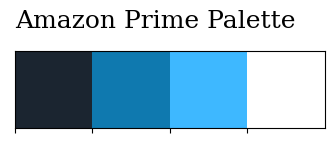

In [92]:
# Color Palette
sns.palplot(['#1b2530', '#0f79af','#3EB8FF','#ffffff'])

plt.title("Amazon Prime Palette ",loc='left',fontfamily='serif',fontsize=18,y=1.2)
plt.show()

In [93]:
showtime.groupby('type').count()


,id,roberta_neg,roberta_neu,roberta_pos,title,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,primary_genre,production_country
type,,,,,,,,,,,,,,,,,,,
MOVIE,9322,9322,9322,9322,9322,9322,9322,9322,9322,9322,9322,9322,8742,8415,8406,8887,7544,9322,9322
SHOW,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1429,1349,1346,1414,1203,1550,1550


In [94]:
x=showtime.groupby(['type'])['type'].count()
y=len(showtime)
r=((x/y)).round(2)

mf_ratio = pd.DataFrame(r).T

In [95]:
mf_ratio

type,MOVIE,SHOW
type,0.86,0.14


In [96]:
# Compute the count for each content type
count_data = showtime['type'].value_counts()

# Create a horizontal bar chart
fig = go.Figure(data=go.Bar(
    y=count_data.index,
    x=count_data.values,
    orientation='h',
    marker=dict(color=['#1b2530', '#3EB8FF'])
))

# Set title and axis labels
fig.update_layout(
    title='Content on Amazon Prime Video',
    xaxis_title='Count',
    yaxis_title='Type of Content', title_x = 0.5
)

# Show the plot
fig.show()

As of 2023, Amazon Prime Video has expanded its presence to over 200 countries worldwide, with the United States leading as the primary market, followed by India.

For every 6 movies streaming on Amazon, there is 1 tv show.

In [97]:
!pip install squarify

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [98]:
import squarify

In [99]:
top_countries = pd.DataFrame(showtime['production_country'].value_counts()[:10])
top_countries = top_countries.reset_index()
top_countries = top_countries[top_countries['index'] != 'No Data']
top_countries

,index,production_country
0,US,5643
1,IN,1154
2,GB,840
4,CA,530
5,JP,210
6,FR,204
7,CN,151
8,AU,144
9,KR,128


In [100]:
top_countries = top_countries.rename(columns = {
    'index' : 'production_country',
    'production_country' : 'content_produced'
})
top_countries

,production_country,content_produced
0,US,5643
1,IN,1154
2,GB,840
4,CA,530
5,JP,210
6,FR,204
7,CN,151
8,AU,144
9,KR,128


In [101]:
import pycountry

In [102]:
abbreviated_countries = top_countries['production_country']

full_countries = []
for abbreviations in abbreviated_countries:
    country_names = []
    for abbreviation in abbreviations.strip("[]'").split(', '):
        try:
            country = pycountry.countries.get(alpha_2=abbreviation.strip())
            if country is not None:
                country_names.append(country.name)
        except KeyError:
            pass
    full_countries.append(country_names)

print(full_countries)

[['United States'], ['India'], ['United Kingdom'], ['Canada'], ['Japan'], ['France'], ['China'], ['Australia'], ['Korea, Republic of']]


In [103]:
top_countries['country_name'] = full_countries

In [104]:
top_countries = top_countries[:4]

In [105]:
fig = px.pie(top_countries, values='content_produced', names='country_name',
             title='Contribution of Content Produced by Top 4 Countries on Amazon Prime Video')

# Change the color palette
fig.update_traces(marker=dict(colors=['#1b2530', '#0f79af', '#3EB8FF', '#f5f5f1','#ffffff']))

# Set the text position and information to be displayed
fig.update_traces(textposition='inside', textinfo='percent+label')

fig.show()

Amazon Prime Video is present in more than 200 countries of the world. Out of which, US is Amazon's largest market, followed by India and the United Kingdom.

As compared to the other global markets, Amazon entered the Indian market much later in 2016 as compared to the United Kingdom in 2007, and Canada in 2013. It’s safe to say that Amazon received a warm reception in India.

In [106]:
country_order = showtime['production_country'].value_counts()[:11].index
data = showtime[['type', 'production_country']].groupby('production_country')['type'].value_counts().unstack().loc[country_order]
data['sum'] = data.sum(axis=1)
data_ratio = (data.T / data['sum']).T[['MOVIE', 'SHOW']].sort_values(by='MOVIE',ascending=False)[::-1]
data_ratio = data_ratio.reset_index()

In [107]:
data_ratio = data_ratio[data_ratio['index'] != 'No Data']

In [108]:
data_ratio.rename(columns = {'index':'country_code'}, inplace = True)
data_ratio['MOVIE'] = round(data_ratio['MOVIE'], 2)

In [109]:
data_ratio['SHOW'] = round(data_ratio['SHOW'],2)
data_ratio

type,country_code,MOVIE,SHOW
0,CN,0.36,0.64
1,JP,0.46,0.54
2,KR,0.52,0.48
3,GB,0.71,0.29
4,AU,0.77,0.23
5,CA,0.85,0.15
6,IT,0.86,0.14
8,FR,0.86,0.14
9,US,0.90,0.10
10,IN,0.95,0.05


In [110]:
abbreviated_countries = data_ratio['country_code']

full_countries = []
for abbreviations in abbreviated_countries:
    country_names = []
    for abbreviation in abbreviations.strip("[]'").split(', '):
        try:
            country = pycountry.countries.get(alpha_2=abbreviation.strip())
            if country is not None:
                country_names.append(country.name)
        except KeyError:
            pass
    full_countries.append(country_names)

print(full_countries)

[['China'], ['Japan'], ['Korea, Republic of'], ['United Kingdom'], ['Australia'], ['Canada'], ['Italy'], ['France'], ['United States'], ['India']]


In [111]:
data_ratio['country_name'] = full_countries

In [112]:
fig = go.Figure()

# Add horizontal bar traces for MOVIE and SHOW
fig.add_trace(go.Bar(
    y=data_ratio.country_code,
    x=data_ratio['MOVIE'],
    name='MOVIE',
    orientation='h',
    marker=dict(color='#1b2530'),
    text=(data_ratio['MOVIE'] * 100).astype(str) + '%',  # Add text as percentages
    textposition='inside',  # Set text position inside the bars
    textfont=dict(color='white')  # Set text color
))

fig.add_trace(go.Bar(
    y=data_ratio.country_code,
    x=data_ratio['SHOW'],
    name='SHOW',
    orientation='h',
    marker=dict(color='#3EB8FF'),
    text=(data_ratio['SHOW'] * 100).astype(str) + '%',  # Add text as percentages
    textposition='inside',  # Set text position inside the bars
    textfont=dict(color='white')  # Set text color
))

# Set the layout
fig.update_layout(
    title="Amazon Prime Video's Content Distribution by Country",
    barmode='stack',
    yaxis_title='Top 10 Countries',
    xaxis=dict(showticklabels=False), title_x = 0.5 # Hide the x-axis tick labels
)

fig.show()

From top level analysis we know that, we watch more movies than tv shows. This chart helps us to further dig deeper into this information on a country.

Amazon demonstrates a keen understanding of its audience preferences by effectively targeting different regions. Asian countries such as South Korea, China, and Japan are recognized for their inclination towards consuming dramatic long-format content. In contrast, audiences in other countries tend to have a greater preference for movies on Amazon Prime Video.

In [113]:
genre_distribution = pd.DataFrame(showtime.groupby('primary_genre')['type'].value_counts())
genre_distribution = genre_distribution.unstack().reset_index().fillna(0).drop(0)
genre_distribution['SUM'] = genre_distribution.sum(axis = 1)

In [114]:
genre_distribution.columns = ['primary_genre', 'MOVIE', 'SHOW', 'total']

In [115]:
genre_distribution = genre_distribution.sort_values('total', ascending = False)

In [116]:
fig = go.Figure()

# Add vertical bar traces for MOVIE and SHOW
fig.add_trace(go.Bar(
    x=genre_distribution['primary_genre'],
    y=genre_distribution['MOVIE'],
    name='MOVIE',
    marker=dict(color='#1b2530'),
#     text=df['MOVIE'].apply(lambda x: f'{x:.1f}%'),
#     textposition='auto'
))

fig.add_trace(go.Bar(
    x=genre_distribution['primary_genre'],
    y=genre_distribution['SHOW'],
    name='SHOW',
    marker=dict(color='#3EB8FF'),
#     text=df['SHOW'].apply(lambda x: f'{x:.1f}%'),
#     textposition='auto'
))

# fig.update_traces(textposition='inside', textinfo='percent+label')

# Set the layout
fig.update_layout(
    title="Amazon Prime Video's Content Distribution by Genre",
    xaxis_title='Genre',
    yaxis_title='Content on Amazon Prime Video',
    barmode='stack', legend_title = 'Type of Content', title_x =0.5
)

fig.show()

Drama holds the leading position among genres on Amazon Prime Video, closely followed by comedy, thriller, and documentaries. The primary reason behind this trend is the balance between supply and demand. The largest markets for Amazon Prime Video, namely the United States and India, exhibit a strong appetite for content rich in drama and comedy. Conversely, British audiences show a greater inclination towards documentaries.

In [117]:
rating_distribution = pd.DataFrame(showtime.groupby('age_certification')['type'].value_counts())
# rating_distribution = genre_distribution.unstack().reset_index().fillna(0).drop(0)
rating_distribution = rating_distribution.unstack().reset_index().fillna(0)
rating_distribution['SUM'] = rating_distribution.sum(axis = 1)
rating_distribution.columns = ['age_certification','MOVIE','SHOW','Total']

In [118]:
rating_distribution = rating_distribution.sort_values('Total', ascending = False).drop(2)

In [119]:
fig = go.Figure()

# Add vertical bar traces for MOVIE and SHOW
fig.add_trace(go.Bar(
    x=rating_distribution['age_certification'],
    y=rating_distribution['MOVIE'],
    name='MOVIE',
    marker=dict(color='#1b2530'),
#     text=df['MOVIE'].apply(lambda x: f'{x:.1f}%'),
#     textposition='auto'
))

fig.add_trace(go.Bar(
    x=rating_distribution['age_certification'],
    y=rating_distribution['SHOW'],
    name='SHOW',
    marker=dict(color='#3EB8FF'),
#     text=df['SHOW'].apply(lambda x: f'{x:.1f}%'),
#     textposition='auto'
))

# fig.update_traces(textposition='inside', textinfo='percent+label')

# Set the layout
fig.update_layout(
    title='Content Distribution by Age Rating Certification on Amazon Prime Video',
    xaxis_title='Genre',
    yaxis_title='Content on Amazon Prime Video',
    barmode='stack', legend_title = 'Type of Content', title_x = 0.5
)

fig.show()

The majority of content available on Amazon Prime Video falls under the R-rated category, comprising the largest portion. Following closely behind is the PG-13 rating, which accounts for approximately half of the content that falls under the R-rated classification.

In [120]:
history = pd.DataFrame(showtime.groupby('release_year')['type'].value_counts())
history = history.unstack().reset_index().fillna(0)
# history['total'] = history.sum(axis = 1)
history.columns = ['release_year','MOVIE','SHOW']
history = history[(history['release_year'] >= 2000) & (history['release_year'] <= 2021)]

In [121]:
fig3 = go.Figure()
fig3.add_trace(go.Scatter(
    x=history['release_year'],
    y=history['MOVIE'],
    mode='lines',
    name='MOVIE',
    fill='tozeroy',
    line=dict(color='#1b2530')
))

fig3.add_trace(go.Scatter(
    x=history['release_year'],
    y=history['SHOW'],
    mode='lines',
    name='SHOW',
    fill='tozeroy',
    line=dict(color='#3EB8FF')
))

# Set the layout
fig3.update_layout(
    title='Content Trend on Amazon Prime Video over the Years',
    xaxis_title='Release Year',
    yaxis_title='Content on Amazon Prime Video', showlegend = True, title_x =0.5
)
fig3.show()

Since 2015, the online streaming industry experienced a significant surge and expansion.

In [122]:
ratings_ages = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

In [123]:
demographic_data = showtime.copy()
demographic_data['target_ages'] = demographic_data['age_certification'].map(ratings_ages)
demographic_data = demographic_data.dropna()

In [124]:
# demographic_data.groupby('production_country','target_ages')[['production_country','target_ages']].sum()
demographic_data = demographic_data.groupby(['production_country', 'target_ages']).size().reset_index(name='count').sort_values('count', ascending = False)[:20]
demographic_data

,production_country,target_ages,count
156,US,Adults,945
159,US,Teens,461
158,US,Older Kids,367
157,US,Kids,165
60,GB,Adults,136
63,GB,Teens,104
21,CA,Adults,84
79,IN,Older Kids,70
23,CA,Older Kids,56
62,GB,Older Kids,52


In [125]:
import plotly.express as px

total_count = demographic_data['count'].sum()
demographic_data['percentage'] = (demographic_data['count'] / total_count) * 100

fig = px.treemap(demographic_data, path=['production_country', 'target_ages'], values='percentage',
                 color='target_ages', color_discrete_sequence=['#1b2530', '#0f79af', '#3EB8FF', '#ffffff'])

fig.update_layout(title= "Amazon Prime Video's Country-Level Target Audience",
                  margin=dict(l=20, r=20, t=40, b=20), title_x = 0.5)  # Adjust the margins as needed

fig.show()

Amazon Prime Video primarily targets adult audiences in America and Europe, tailoring its content offerings to cater to their preferences. However, in Asian regions, Amazon adopts a different approach by targeting older children as its audience. This strategic shift in targeting explains the composition of content on Amazon Prime Video, with R-rated content comprising the largest portion, followed by a significant presence of PG-13 content.

In [129]:
demo_genre = showtime.groupby(['production_country', 'primary_genre']).size().reset_index(name='count').sort_values('count', ascending = False)[:20]
demo_genre = demo_genre[demo_genre['production_country']!='No Data']
import plotly.express as px

fig = px.treemap(demo_genre, path=['production_country', 'primary_genre'], values='count',
                 color='count', color_continuous_scale='Blues', hover_data=['count'])

fig.update_layout(title='Amazon Prime Video Content by Genre and Country',
                  margin=dict(l=20, r=20, t=40, b=20), title_x = 0.5)  # Adjust the margins as needed

fig.show()

Upon analyzing the breakdown of content on Amazon Prime Video by country and genre, it becomes apparent that the platform offers a substantial amount of dramatic content, followed by comedy.
Interestingly, when examining specific preferences by country, it is observed that Indian audiences show a strong affinity for thriller and action genres, suggesting a preference for more intense and adrenaline-pumping content. On the other hand, British viewers exhibit a greater interest in documentaries, indicating a fascination for factual and informative programming.

In [130]:
fig = px.scatter(showtime, x='imdb_score', y='tmdb_score', color='type',
                 color_discrete_map={'MOVIE': '#1b2530', 'SHOW': '#3EB8FF'},
                 hover_data=['title'])

fig.update_layout(title='IMDb Score vs TMDB Score',
                  xaxis_title='IMDb Score',
                  yaxis_title='TMDB Score',
                  legend_title='Type', title_x =0.5)

fig.show()

Despite movies comprising a significant portion of the content available on Amazon Prime Video, it is noteworthy that TV shows tend to receive higher ratings. This suggests that the quality and appeal of the TV shows offered on the platform are often regarded more favorably by viewers compared to the movies.

In [132]:
sample = showtime.sample(n=1000, random_state=42)
fig = px.scatter(sample, x='roberta_neg', y='roberta_pos', color='type',
                 color_discrete_map={'MOVIE': '#1b2530', 'SHOW': '#3EB8FF'},
                 hover_data=['title'])

fig.update_layout(title='Understanding the relationship between Roberta scores for content on Prime',
                  xaxis_title='Roberta Negative Score',
                  yaxis_title='Roberta Positive Score',
                  legend_title='Type', title_x = 0.5)

fig.show()

Hugging Face’s Roberta model helps in gauging the sentiment of the content based on the description provided. Roberta excels in understanding context and language patterns and is better at sarcastic sentences, while VADER focuses on sentiment quantification.
The chart provides a quality assessment for each of the movies using the Roberta model. The model helps us in understanding what type of content is produced by Amazon and enjoyed by the audience.


In [133]:
showtime['sentiment'] = showtime.apply(lambda row: 'Negative' if row['roberta_neg'] > 0.5 else ('Neutral' if row['roberta_neu'] > 0.5 else 'Positive'), axis=1)


In [134]:
sentiment_counts = showtime['sentiment'].value_counts()

# Create the donut chart trace
fig = go.Figure(data=[go.Pie(
    labels=sentiment_counts.index,
    values=sentiment_counts.values,
    hole=0.5,  # Set the hole parameter to create a donut chart
    marker=dict(colors=['#1b2530', '#0f79af', '#3EB8FF']),  # Set custom colors for the slices
    textinfo='label+percent',  # Display labels and percentages
    textposition='inside',  # Set the position of the labels inside the slice
)])

# Set the layout
fig.update_layout(
    title='Sentiment Distribution of Content on Amazon Prime Video',
    showlegend=True, title_x = 0.5, 
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Amazon Prime Video', x=0.50, y=0.5, font_size=15, showarrow=False)]
)
fig.show()

According to the data, approximately 48% of the content on Amazon is categorized as neutral, indicating a lack of strong positive or negative sentiment. Furthermore, around 31% of the content is classified as negative, suggesting that a significant portion of the content elicits a negative sentiment or has negative connotations.

In [135]:
fig = px.scatter(showtime, x='imdb_score', y='tmdb_score', color='sentiment',
                 color_discrete_map={'Negative': '#1b2530', 'Neutral': '#0f79af', 'Positive': '#3EB8FF'},
                 hover_data=['title'])

fig.update_layout(title='IMDb Score vs TMDB Score',
                  xaxis_title='IMDb Score',
                  yaxis_title='TMDB Score',
                  legend_title='Type', title_x = 0.5)

fig.show()

In [136]:
genre_sentiment = showtime.groupby(['primary_genre', 'sentiment']).size().reset_index(name='count')
genre_sentiment = genre_sentiment[genre_sentiment['primary_genre']!= 'No Data']
genre_sentiment = genre_sentiment.sort_values('count', ascending = False)

In [137]:
colors = ['#1b2530', '#0f79af', '#3EB8FF', '#ffffff']

fig = px.sunburst(genre_sentiment, path=['primary_genre', 'sentiment'], values='count',
                  color_discrete_sequence=colors)

fig.update_layout(title='Genre vs Sentiments on Amazon Prime Video', title_x = 0.5)

fig.show()

Based on the description of genres such as thriller, crime, western, and horror, these genres often evoke a negative sentiment. This could be due to the nature of the themes, settings, and storylines typically associated with these genres. Elements like suspense, criminal activities, conflict, and fear are commonly depicted, which can contribute to a darker or more negative tone in the overall sentiment of the content within these genres.

In [138]:
age_certificate_sentiment = showtime.groupby(['age_certification', 'sentiment']).size().reset_index(name='count')
age_certificate_sentiment = age_certificate_sentiment[age_certificate_sentiment['age_certification']!= 'No Data']
age_certificate_sentiment = age_certificate_sentiment.sort_values('count', ascending = False)

In [139]:
fig = px.sunburst(age_certificate_sentiment, path=['age_certification', 'sentiment'], values='count',
                  color_discrete_sequence=colors)

fig.update_layout(title='Rating vs Sentiments on Amazon Prime Video', title_x = 0.5)

fig.show()

It appears that a higher proportion of R-rated content on Amazon is classified as negative. This could be due to the nature of R-rated content, which often includes mature or explicit themes, intense violence, or disturbing elements. Such content may be more likely to evoke negative emotions or elicit a darker tone, leading to a higher classification of negativity.

In [140]:
from sklearn.preprocessing import StandardScaler

In [141]:
scaler = StandardScaler()

In [142]:
showtime['scaled_tmdb_pop'] = scaler.fit_transform(showtime[['tmdb_popularity']])

In [143]:
fig = px.violin(showtime, x='sentiment', y='scaled_tmdb_pop', color_discrete_sequence = colors)

# Set the layout
fig.update_layout(
    title='Violin Plot: Relationship between sentiments and tmdb popularity',
    xaxis_title='Sentiments',
    yaxis_title='TMDB Popularity'
)

fig.show()

In [144]:
filter_showtime = showtime[(showtime['release_year'] >= 2010) & (showtime['release_year'] <= 2020)]

filter_showtime = filter_showtime.groupby(['release_year', 'sentiment']).size().reset_index(name='count')

colors = ['#1b2530', '#0f79af', '#3EB8FF', '#ffffff']

fig = px.area(filter_showtime, x='release_year', y='count', color='sentiment',
              color_discrete_sequence=colors,
              title='Trend of Content Released Over Time')

# Set the layout
fig.update_layout(
    xaxis_title='Release Year',
    yaxis_title='Content Streamed on Amazon Prime Video',
    legend_title='Sentiment', title_x = 0.5
)
fig.show()

In [145]:
numeric_columns = showtime.select_dtypes(include=[int, float])

In [146]:
colors = ['#1b2530', '#0f79af', '#3EB8FF', '#ffffff']

fig = px.histogram(showtime, x='runtime', color_discrete_sequence=colors, nbins = 50)

# Customize the layout if needed
fig.update_layout(
    title='Runtime Distribution of Content on Amazon Prime Video',
    xaxis_title='Runtime',
    yaxis_title='Count of Content', title_x = 0.5, bargap=0.2
)

fig.show()

In [147]:
colors = [ '#0f79af', '#3EB8FF', '#ffffff']

fig = px.histogram(showtime, x='seasons', color_discrete_sequence=colors, nbins = 50)

# Customize the layout if needed
fig.update_layout(
    title='Number of Seasons Distribution of Content on Amazon Prime Video',
    xaxis_title='Number of Seasons',
    yaxis_title='Count of Content', title_x = 0.5, bargap=0.2
)

fig.show()

In [148]:
colors = [ '#3EB8FF', '#ffffff']

fig = px.histogram(showtime, x='imdb_score', color_discrete_sequence=colors)

# Customize the layout if needed
fig.update_layout(
    title='IMDB Score Distribution of Content on Amazon Prime Video',
    xaxis_title='IMDB Score',
    yaxis_title='Count of Content', title_x = 0.5, bargap=0.2
)

fig.show()

IMDb ratings are based on a scale of 1 to 10. The ratings are determined by the votes and reviews submitted by IMDb users. IMDb takes into account the ratings given by regular users as well as those from industry professionals, such as critics and filmmakers.

With this we come to the end of our analysis on Amazon Prime Video.

Amazon excels in leveraging numbers to its advantage, targeting a wide audience base primarily in America, Europe, and India. The platform adeptly caters to movie enthusiasts by offering a diverse range of genres, which are broadly classified with neutral and negative sentiments. This positioning makes Amazon Prime Video a suitable choice for a mature audience seeking varied content options.